learning algorithm에 쓰이는 objective funciton의 많은 원소들은 모든 feature가 centered around zero, variance in the same order임을 가정하는 경우가 많다.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv("/content/data0520")
df.describe()

,b_type,in_ch,3x3_Conv_0,5x5_Conv_0,3x3_ConvDW_0,5x5_ConvDW_0,3x3_dConv_0,5x5_dConv_0,3x3_dConvDW_0,5x5_dConvDW_0,3x3_maxpool_0,3x3_avgpool_0,Identity_0,3x3_Conv_1,5x5_Conv_1,3x3_ConvDW_1,5x5_ConvDW_1,3x3_dConv_1,5x5_dConv_1,3x3_dConvDW_1,5x5_dConvDW_1,3x3_maxpool_1,3x3_avgpool_1,Identity_1,3x3_Conv_2,5x5_Conv_2,3x3_ConvDW_2,5x5_ConvDW_2,3x3_dConv_2,5x5_dConv_2,3x3_dConvDW_2,5x5_dConvDW_2,3x3_maxpool_2,3x3_avgpool_2,Identity_2,3x3_Conv_3,5x5_Conv_3,3x3_ConvDW_3,5x5_ConvDW_3,3x3_dConv_3,...,5x5_dConv_11,3x3_dConvDW_11,5x5_dConvDW_11,3x3_maxpool_11,3x3_avgpool_11,Identity_11,3x3_Conv_12,5x5_Conv_12,3x3_ConvDW_12,5x5_ConvDW_12,3x3_dConv_12,5x5_dConv_12,3x3_dConvDW_12,5x5_dConvDW_12,3x3_maxpool_12,3x3_avgpool_12,Identity_12,3x3_Conv_13,5x5_Conv_13,3x3_ConvDW_13,5x5_ConvDW_13,3x3_dConv_13,5x5_dConv_13,3x3_dConvDW_13,5x5_dConvDW_13,3x3_maxpool_13,3x3_avgpool_13,Identity_13,3x3_Conv_14,5x5_Conv_14,3x3_ConvDW_14,5x5_ConvDW_14,3x3_dConv_14,5x5_dConv_14,3x3_dConvDW_14,5x5_dConvDW_14,3x3_maxpool_14,3x3_avgpool_14,Identity_14,latency
count,7020.000000,7020.000000,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7020.000000,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7020.000000,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,...,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7.020000e+03,7020.000000
mean,0.579772,447.975783,9.338892e-02,9.421865e-02,9.418024e-02,9.624853e-02,9.624364e-02,9.417242e-02,9.493846e-02,9.397393e-02,9.362107e-02,9.615919e-02,0.052201,9.346816e-02,9.372676e-02,9.722500e-02,9.275830e-02,9.269662e-02,9.408321e-02,9.262673e-02,9.656095e-02,9.458632e-02,9.441976e-02,0.057159,8.863206e-02,9.049111e-02,9.341332e-02,9.143187e-02,8.508605e-02,9.257793e-02,9.447693e-02,8.724437e-02,9.205097e-02,9.398831e-02,9.013678e-02,9.784225e-02,9.411803e-02,9.239554e-02,9.731723e-02,9.679129e-02,...,9.090219e-02,8.885989e-02,9.096054e-02,9.075991e-02,9.329674e-02,8.829018e-02,8.838169e-02,8.810405e-02,9.204640e-02,9.115719e-02,9.326003e-02,9.201635e-02,9.321709e-02,9.013765e-02,8.919121e-02,9.138339e-02,9.059459e-02,8.818090e-02,9.173844e-02,9.058825e-02,9.466228e-02,9.499975e-02,8.781095e-02,9.108717e-02,8.886955e-02,8.899872e-02,9.322353e-02,8.927778e-02,9.708376e-02,8.808648e-02,8.618825e-02,8.996129e-02,9.021599e-02,9.350908e-02,9.234828e-02,9.007220e-02,8.754462e-02,9.239753e-02,9.212983e-02,232272.521814
std,0.493631,275.316421,1.929962e-01,1.969846e-01,1.980538e-01,1.992547e-01,1.973813e-01,1.976447e-01,1.981473e-01,1.959338e-01,1.958560e-01,2.006101e-01,0.153596,1.929464e-01,1.910493e-01,1.997146e-01,1.949409e-01,1.950937e-01,1.932859e-01,1.950548e-01,1.974252e-01,1.941625e-01,1.943896e-01,0.160359,1.910621e-01,1.928418e-01,1.947335e-01,1.900705e-01,1.837884e-01,1.925001e-01,1.966847e-01,1.885930e-01,1.956835e-01,1.985804e-01,1.921359e-01,2.008750e-01,1.945538e-01,1.944243e-01,1.981386e-01,1.971631e-01,...,1.941477e-01,1.915636e-01,1.924820e-01,1.917784e-01,1.979126e-01,1.893555e-01,1.889881e-01,1.877888e-01,1.932695e-01,1.923504e-01,1.965519e-01,1.950804e-01,1.958208e-01,1.919205e-01,1.904540e-01,1.967904e-01,1.927285e-01,1.876778e-01,1.944206e-01,1.920398e-01,1.965116e-01,1.992663e-01,1.900066e-01,1.942146e-01,1.899961e-01,1.887246e-01,1.961432e-01,1.900927e-01,2.0

In [0]:
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler, RobustScaler, PowerTransformer, QuantileTransformer

In [7]:
prob = df.columns.difference(['b_type', 'latency', 'in_ch'], sort = False)
prob

Index(['3x3_Conv_0', '5x5_Conv_0', '3x3_ConvDW_0', '5x5_ConvDW_0',
       '3x3_dConv_0', '5x5_dConv_0', '3x3_dConvDW_0', '5x5_dConvDW_0',
       '3x3_maxpool_0', '3x3_avgpool_0',
       ...
       '5x5_Conv_14', '3x3_ConvDW_14', '5x5_ConvDW_14', '3x3_dConv_14',
       '5x5_dConv_14', '3x3_dConvDW_14', '5x5_dConvDW_14', '3x3_maxpool_14',
       '3x3_avgpool_14', 'Identity_14'],
      dtype='object', length=165)

In [0]:
in_ch_lin = make_pipeline(StandardScaler(), \
                          QuantileTransformer(n_quantiles = 100, output_distribution = 'normal'))
prob_lin = make_pipeline(MaxAbsScaler(), \
                         QuantileTransformer(n_quantiles = 1000, output_distribution = 'normal'))
latency_lin = make_pipeline(RobustScaler(), \
                            QuantileTransformer(n_quantiles = 1000, output_distribution = 'normal')) # power transformer's default is Yeo-Johnson

In [0]:
preprocess = make_column_transformer(
    (in_ch_lin, ['in_ch']),
    (prob_lin, prob),
    (latency_lin, ['latency'])
)

In [37]:
fitted = pd.DataFrame(preprocess.fit_transform(df), columns = df.columns[1:168])
fitted

,in_ch,3x3_Conv_0,5x5_Conv_0,3x3_ConvDW_0,5x5_ConvDW_0,3x3_dConv_0,5x5_dConv_0,3x3_dConvDW_0,5x5_dConvDW_0,3x3_maxpool_0,3x3_avgpool_0,Identity_0,3x3_Conv_1,5x5_Conv_1,3x3_ConvDW_1,5x5_ConvDW_1,3x3_dConv_1,5x5_dConv_1,3x3_dConvDW_1,5x5_dConvDW_1,3x3_maxpool_1,3x3_avgpool_1,Identity_1,3x3_Conv_2,5x5_Conv_2,3x3_ConvDW_2,5x5_ConvDW_2,3x3_dConv_2,5x5_dConv_2,3x3_dConvDW_2,5x5_dConvDW_2,3x3_maxpool_2,3x3_avgpool_2,Identity_2,3x3_Conv_3,5x5_Conv_3,3x3_ConvDW_3,5x5_ConvDW_3,3x3_dConv_3,5x5_dConv_3,...,5x5_dConv_11,3x3_dConvDW_11,5x5_dConvDW_11,3x3_maxpool_11,3x3_avgpool_11,Identity_11,3x3_Conv_12,5x5_Conv_12,3x3_ConvDW_12,5x5_ConvDW_12,3x3_dConv_12,5x5_dConv_12,3x3_dConvDW_12,5x5_dConvDW_12,3x3_maxpool_12,3x3_avgpool_12,Identity_12,3x3_Conv_13,5x5_Conv_13,3x3_ConvDW_13,5x5_ConvDW_13,3x3_dConv_13,5x5_dConv_13,3x3_dConvDW_13,5x5_dConvDW_13,3x3_maxpool_13,3x3_avgpool_13,Identity_13,3x3_Conv_14,5x5_Conv_14,3x3_ConvDW_14,5x5_ConvDW_14,3x3_dConv_14,5x5_dConv_14,3x3_dConvDW_14,5x5_dConvDW_14,3x3_maxpool_14,3x3_avgpool_14,Identity_14,latency
0,-0.105694,-1.268585,0.034280,0.088689,-1.428291,-0.765825,1.195483,-0.837409,1.326223,0.246931,1.116668,1.061575,0.652063,-0.966549,1.254743,-0.913034,-0.606928,0.349683,0.099537,1.581103,-0.470821,-0.807062,0.047139,0.745451,1.301443,-0.631125,0.672111,1.259868,0.088676,0.603785,0.866201,0.666343,-0.362711,-0.433720,-0.119271,-1.068206,1.846317,0.170601,-0.708521,0.878391,...,-1.110994,1.063935,-0.810585,0.593444,-0.841360,-1.531179,0.977145,1.798636,-0.302886,0.367556,-0.003477,0.476120,0.847320,0.051078,-0.585924,0.337492,-0.480502,1.631423,-0.472398,1.201823,0.051399,0.094232,0.699059,0.601049,0.283573,0.132047,-0.553540,0.283444,-1.432585,0.927991,-1.996510,0.741349,-1.095785,1.695053,0.142634,-0.516759,0.958509,-0.535294,-0.441921,-0.052342
1,-0.105694,-1.552363,-0.968592,1.616244,-0.978944,0.113369,0.932577,-1.040075,-2.052847,1.077863,0.492580,-0.099268,0.325447,-0.038345,-0.385231,0.539344,-0.124550,0.428539,-0.634830,-0.360599,1.506559,1.285279,1.004574,1.111424,0.062217,-0.445357,-0.158451,0.824559,-0.304039,-0.411392,0.669482,0.188061,1.626179,0.436091,0.274571,0.554964,0.955392,1.433730,-0.475946,0.350577,...,0.557391,0.661065,-0.860828,-0.555002,-0.338582,-1.143261,1.084010,0.363571,1.473331,-0.536466,-0.811560,-0.993789,-0.100173,-0.689817,0.068320,-0.447257,1.225010,-1.023002,-0.221330,0.131861,-0.391116,2.216893,0.591818,-0.498369,-0.238401,-0.030540,0.639329,-0.712083,-1.160968,-0.628857,0.766441,-0.499441,-1.870190,-0.421694,-0.098675,2.267808,-0.636898,0.572379,-0.092054,-0.071476
2,-0.105694,1.358030,0.343615,-1.265393,-1.519004,-1.689102,-1.973204,-0.936835,-0.564042,1.385176,-5.199338,1.322729,1.733538,0.302250,0.753197,-0.364377,-0.139989,0.576006,-0.436217,-0.277104,-1.600334,-0.420886,1.309241,-5.199338,0.275258,0.574280,-0.588525,-5.199338,1.031964,-1.860230,-1.527812,0.906838,-0.861425,1.689388,0.948906,0.453071,0.423663,-0.901733,1.037697,0.437668,...,-5.199338,-0.180403,-1.434365,-5.199338,0.812964,-1.634858,1.282324,1.293419,-0.914257,0.094238,-1.404384,-0.839129,-0.176106,-0.688499,1.294466,0.359769,-1.156927,-0.807529,-0.757637,-0.642760,0.328986,0.685108,-1.493689,1.631086,-1.502478,1.313858,-0.164822,-0.602386,-0.021681,-1.312415,1.650538,-1.133263,-0.423677,0.412092,1.322388,0.449442,0.356560,-0.566399,-0.423526,-0.032683
3,-0.105694,1.350726,-0.019205,0.157315,-0.086913,-0.349480,1.291559,-0.251500,0.758106,0.621079,0.712477,0.251501,-1.431984,0.930230,0.772930,-1.879404,0.630240,1.259236,-0.059784,1.248771,-1.677144,-0.111218,0.413919,0.166457,-0.492139,-0.203751,-1.547170,-1.337149,0.074508,-1.453803,2.517842,-0.791988,-0.370911,0.523850,0.040916,-0.604548,-0.910848,-1.727722,-0.164695,0.102908,...,2.609308,-0.768624,-0.247267,-0.507372,-1.222213,-0.607347,-1.414220,0.721109,0.476265,0.559995,0.016446,0.911505,1.571280,0.935764,-0.641934,-1.218303,-0.018633,-1.816692,-0.294118,-1.777421,-0.444520,-0.475472,-1.435063,-1.708149,3.351421,-0.549064,-0.976784,-0.182040

In [38]:
fitted = pd.concat([df.iloc[:,:1], fitted], axis=1)
fitted

,b_type,in_ch,3x3_Conv_0,5x5_Conv_0,3x3_ConvDW_0,5x5_ConvDW_0,3x3_dConv_0,5x5_dConv_0,3x3_dConvDW_0,5x5_dConvDW_0,3x3_maxpool_0,3x3_avgpool_0,Identity_0,3x3_Conv_1,5x5_Conv_1,3x3_ConvDW_1,5x5_ConvDW_1,3x3_dConv_1,5x5_dConv_1,3x3_dConvDW_1,5x5_dConvDW_1,3x3_maxpool_1,3x3_avgpool_1,Identity_1,3x3_Conv_2,5x5_Conv_2,3x3_ConvDW_2,5x5_ConvDW_2,3x3_dConv_2,5x5_dConv_2,3x3_dConvDW_2,5x5_dConvDW_2,3x3_maxpool_2,3x3_avgpool_2,Identity_2,3x3_Conv_3,5x5_Conv_3,3x3_ConvDW_3,5x5_ConvDW_3,3x3_dConv_3,...,5x5_dConv_11,3x3_dConvDW_11,5x5_dConvDW_11,3x3_maxpool_11,3x3_avgpool_11,Identity_11,3x3_Conv_12,5x5_Conv_12,3x3_ConvDW_12,5x5_ConvDW_12,3x3_dConv_12,5x5_dConv_12,3x3_dConvDW_12,5x5_dConvDW_12,3x3_maxpool_12,3x3_avgpool_12,Identity_12,3x3_Conv_13,5x5_Conv_13,3x3_ConvDW_13,5x5_ConvDW_13,3x3_dConv_13,5x5_dConv_13,3x3_dConvDW_13,5x5_dConvDW_13,3x3_maxpool_13,3x3_avgpool_13,Identity_13,3x3_Conv_14,5x5_Conv_14,3x3_ConvDW_14,5x5_ConvDW_14,3x3_dConv_14,5x5_dConv_14,3x3_dConvDW_14,5x5_dConvDW_14,3x3_maxpool_14,3x3_avgpool_14,Identity_14,latency
0,1,-0.105694,-1.268585,0.034280,0.088689,-1.428291,-0.765825,1.195483,-0.837409,1.326223,0.246931,1.116668,1.061575,0.652063,-0.966549,1.254743,-0.913034,-0.606928,0.349683,0.099537,1.581103,-0.470821,-0.807062,0.047139,0.745451,1.301443,-0.631125,0.672111,1.259868,0.088676,0.603785,0.866201,0.666343,-0.362711,-0.433720,-0.119271,-1.068206,1.846317,0.170601,-0.708521,...,-1.110994,1.063935,-0.810585,0.593444,-0.841360,-1.531179,0.977145,1.798636,-0.302886,0.367556,-0.003477,0.476120,0.847320,0.051078,-0.585924,0.337492,-0.480502,1.631423,-0.472398,1.201823,0.051399,0.094232,0.699059,0.601049,0.283573,0.132047,-0.553540,0.283444,-1.432585,0.927991,-1.996510,0.741349,-1.095785,1.695053,0.142634,-0.516759,0.958509,-0.535294,-0.441921,-0.052342
1,1,-0.105694,-1.552363,-0.968592,1.616244,-0.978944,0.113369,0.932577,-1.040075,-2.052847,1.077863,0.492580,-0.099268,0.325447,-0.038345,-0.385231,0.539344,-0.124550,0.428539,-0.634830,-0.360599,1.506559,1.285279,1.004574,1.111424,0.062217,-0.445357,-0.158451,0.824559,-0.304039,-0.411392,0.669482,0.188061,1.626179,0.436091,0.274571,0.554964,0.955392,1.433730,-0.475946,...,0.557391,0.661065,-0.860828,-0.555002,-0.338582,-1.143261,1.084010,0.363571,1.473331,-0.536466,-0.811560,-0.993789,-0.100173,-0.689817,0.068320,-0.447257,1.225010,-1.023002,-0.221330,0.131861,-0.391116,2.216893,0.591818,-0.498369,-0.238401,-0.030540,0.639329,-0.712083,-1.160968,-0.628857,0.766441,-0.499441,-1.870190,-0.421694,-0.098675,2.267808,-0.636898,0.572379,-0.092054,-0.071476
2,1,-0.105694,1.358030,0.343615,-1.265393,-1.519004,-1.689102,-1.973204,-0.936835,-0.564042,1.385176,-5.199338,1.322729,1.733538,0.302250,0.753197,-0.364377,-0.139989,0.576006,-0.436217,-0.277104,-1.600334,-0.420886,1.309241,-5.199338,0.275258,0.574280,-0.588525,-5.199338,1.031964,-1.860230,-1.527812,0.906838,-0.861425,1.689388,0.948906,0.453071,0.423663,-0.901733,1.037697,...,-5.199338,-0.180403,-1.434365,-5.199338,0.812964,-1.634858,1.282324,1.293419,-0.914257,0.094238,-1.404384,-0.839129,-0.176106,-0.688499,1.294466,0.359769,-1.156927,-0.807529,-0.757637,-0.642760,0.328986,0.685108,-1.493689,1.631086,-1.502478,1.313858,-0.164822,-0.602386,-0.021681,-1.312415,1.650538,-1.133263,-0.423677,0.412092,1.322388,0.449442,0.356560,-0.566399,-0.423526,-0.032683
3,1,-0.105694,1.350726,-0.019205,0.157315,-0.086913,-0.349480,1.291559,-0.251500,0.758106,0.621079,0.712477,0.251501,-1.431984,0.930230,0.772930,-1.879404,0.630240,1.259236,-0.059784,1.248771,-1.677144,-0.111218,0.413919,0.166457,-0.492139,-0.203751,-1.547170,-1.337149,0.074508,-1.453803,2.517842,-0.791988,-0.370911,0.523850,0.040916,-0.604548,-0.910848,-1.727722,-0.164695,...,2.609308,-0.768624,-0.247267,-0.507372,-1.222213,-0.607347,-1.414220,0.721109,0.476265,0.559995,0.016446,0.911505,1.571280,0.935764,-0.641934,-1.218303,-0.018633,-1.816692,-0.294118,-1.777421,-0.444520,-0.475472,-1.435063,-1.708149,3.351421,-0.549064,-0.976784,-0.182040,-0.568785,1.800480,0.927403,-0.1

In [39]:
fitted.describe()

,b_type,in_ch,3x3_Conv_0,5x5_Conv_0,3x3_ConvDW_0,5x5_ConvDW_0,3x3_dConv_0,5x5_dConv_0,3x3_dConvDW_0,5x5_dConvDW_0,3x3_maxpool_0,3x3_avgpool_0,Identity_0,3x3_Conv_1,5x5_Conv_1,3x3_ConvDW_1,5x5_ConvDW_1,3x3_dConv_1,5x5_dConv_1,3x3_dConvDW_1,5x5_dConvDW_1,3x3_maxpool_1,3x3_avgpool_1,Identity_1,3x3_Conv_2,5x5_Conv_2,3x3_ConvDW_2,5x5_ConvDW_2,3x3_dConv_2,5x5_dConv_2,3x3_dConvDW_2,5x5_dConvDW_2,3x3_maxpool_2,3x3_avgpool_2,Identity_2,3x3_Conv_3,5x5_Conv_3,3x3_ConvDW_3,5x5_ConvDW_3,3x3_dConv_3,...,5x5_dConv_11,3x3_dConvDW_11,5x5_dConvDW_11,3x3_maxpool_11,3x3_avgpool_11,Identity_11,3x3_Conv_12,5x5_Conv_12,3x3_ConvDW_12,5x5_ConvDW_12,3x3_dConv_12,5x5_dConv_12,3x3_dConvDW_12,5x5_dConvDW_12,3x3_maxpool_12,3x3_avgpool_12,Identity_12,3x3_Conv_13,5x5_Conv_13,3x3_ConvDW_13,5x5_ConvDW_13,3x3_dConv_13,5x5_dConv_13,3x3_dConvDW_13,5x5_dConvDW_13,3x3_maxpool_13,3x3_avgpool_13,Identity_13,3x3_Conv_14,5x5_Conv_14,3x3_ConvDW_14,5x5_ConvDW_14,3x3_dConv_14,5x5_dConv_14,3x3_dConvDW_14,5x5_dConvDW_14,3x3_maxpool_14,3x3_avgpool_14,Identity_14,latency
count,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,...,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000,7020.000000
mean,0.579772,-0.007989,-0.035365,-0.029235,-0.033246,-0.026585,-0.026570,-0.034973,-0.030742,-0.031136,-0.030016,-0.034213,-1.837776,-0.027388,-0.029526,-0.023819,-0.020067,-0.026192,-0.028986,-0.032212,-0.028663,-0.029905,-0.023703,-1.834273,-0.028127,-0.031788,-0.029470,-0.039578,-0.040886,-0.031768,-0.035388,-0.036689,-0.034448,-0.038030,-0.034950,-0.023866,-0.024706,-0.032536,-0.029121,-0.028823,...,-0.032544,-0.043188,-0.034469,-0.040872,-0.044248,-0.034905,-0.038071,-0.042232,-0.034332,-0.035900,-0.037125,-0.038756,-0.036326,-0.042323,-0.038254,-0.038773,-0.038806,-0.044037,-0.037606,-0.042849,-0.037511,-0.029955,-0.041414,-0.034710,-0.039082,-0.034939,-0.044996,-0.032937,-0.034902,-0.032326,-0.032871,-0.038526,-0.034588,-0.032359,-0.033711,-0.040147,-0.038195,-0.036279,-0.032322,-0.000098
std,0.493631,1.052322,1.130389,1.109088,1.123582,1.101266,1.101323,1.128965,1.115023,1.116575,1.112062,1.125910,2.954052,1.104127,1.110786,1.091190,1.078801,1.099795,1.109867,1.121330,1.108064,1.112429,1.091581,2.952874,1.107068,1.119904,1.111193,1.144308,1.148468,1.117283,1.130320,1.134473,1.127872,1.138445,1.128943,1.091053,1.093721,1.120339,1.109529,1.107563,...,1.120344,1.154865,1.127691,1.148574,1.159933,1.129139,1.138242,1.152456,1.128303,1.131479,1.135908,1.141523,1.132838,1.152228,1.140359,1.141429,1.141316,1.157710,1.137044,1.153368,1.137346,1.112220,1.149606,1.127078,1.143317,1.128931,1.160277,1.121648,1.129197,1.120976,1.122046,1.139664,1.127529,1.120886,1.124698,1.145410,1.140624,1.133080,1.120944,1.002232
min,0.000000,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,...,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338

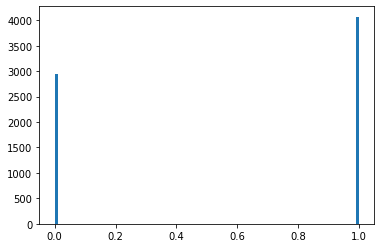

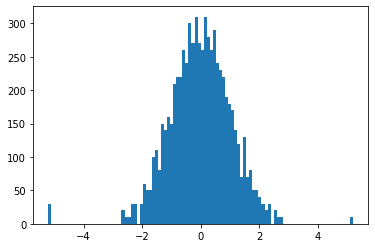

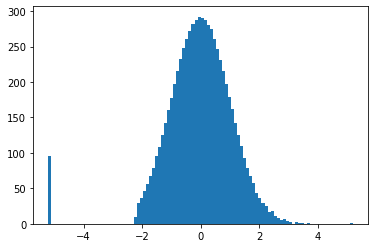

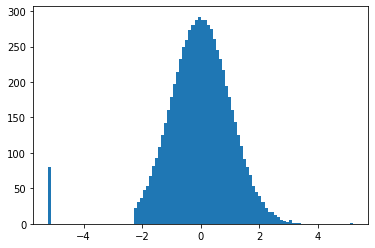

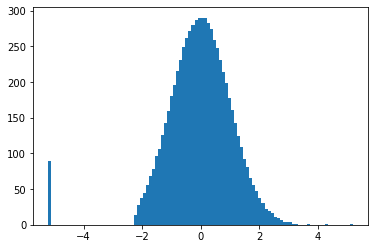

...

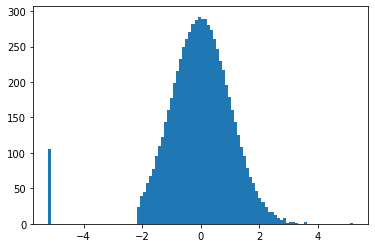

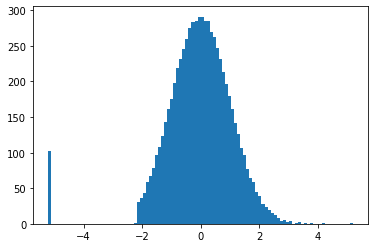

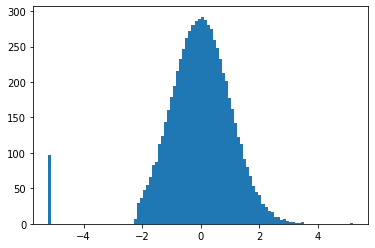

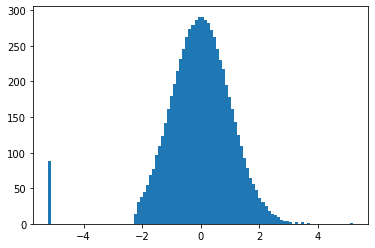

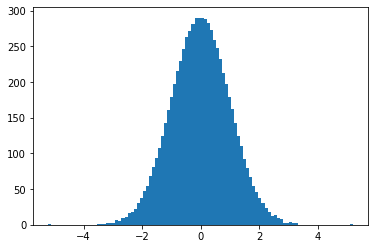

In [40]:
for col in fitted.columns:
  plt.hist(fitted[col], bins = 100)
  plt.show()

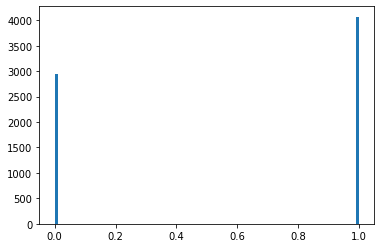

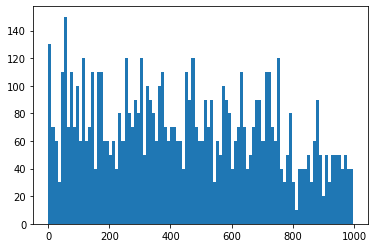

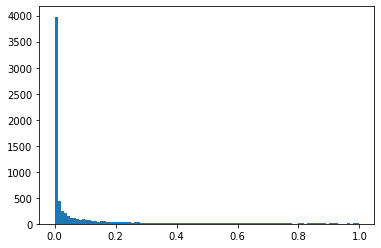

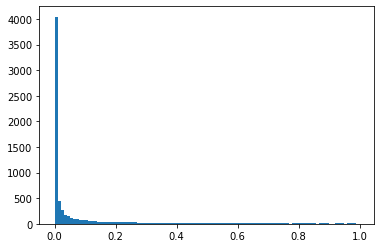

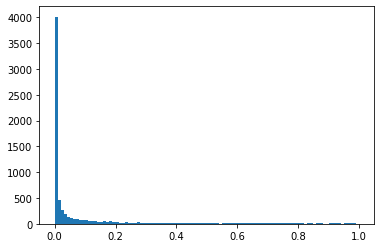

...

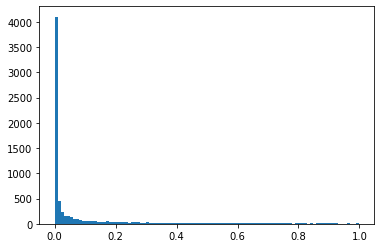

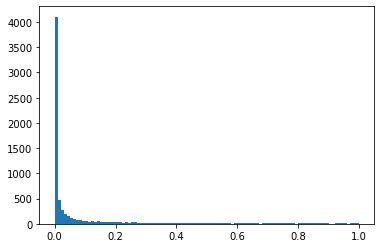

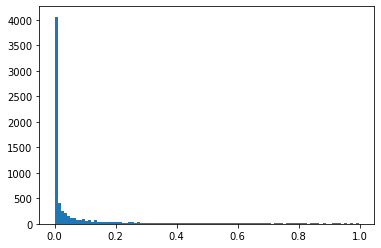

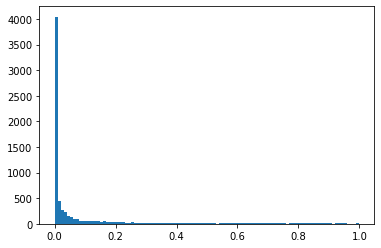

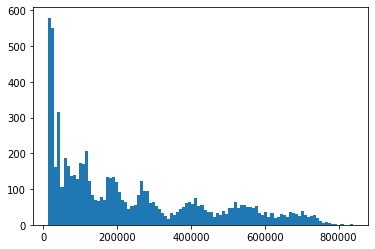

In [111]:
for col in df.columns:
  plt.hist(df[col], bins = 100)
  plt.show()

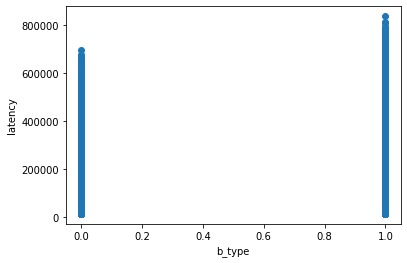

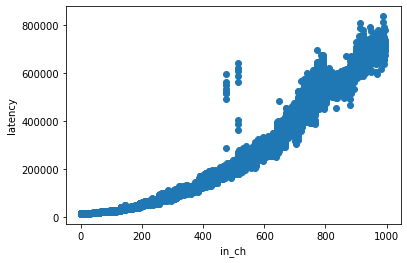

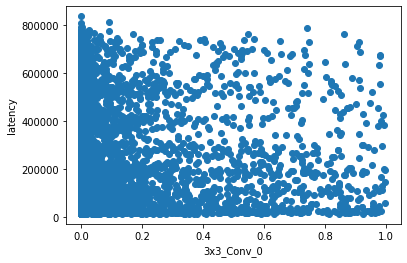

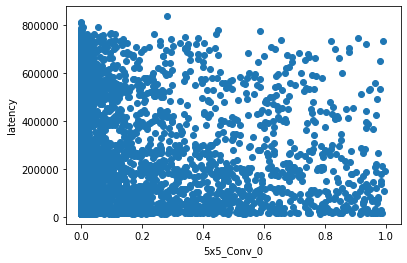

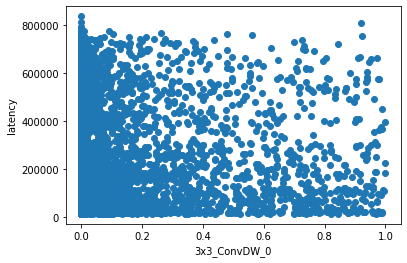

...

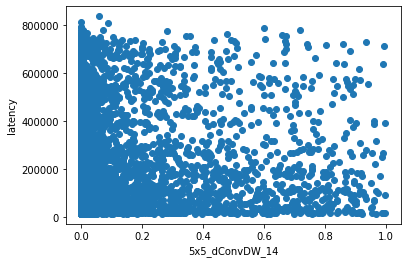

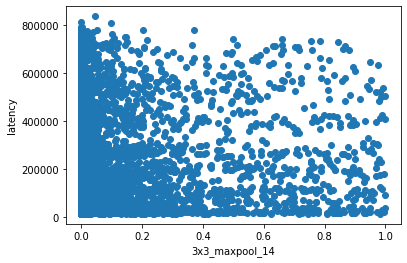

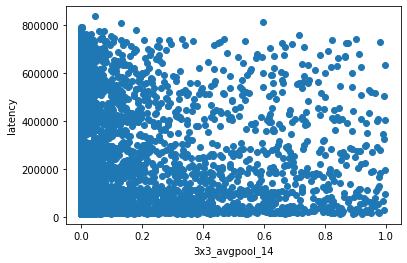

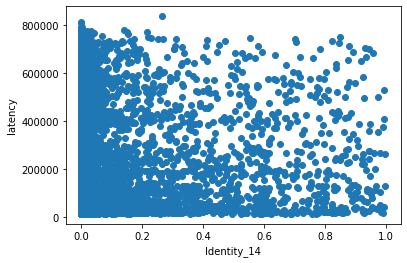

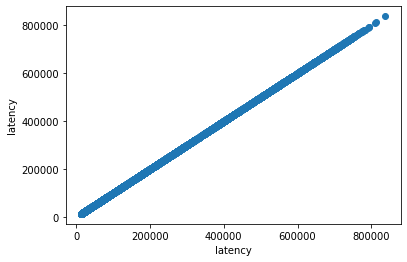

In [128]:
for i in range(len(df.columns)):
    plt.scatter(df[df.columns[i]], df['latency'])
    plt.xlabel(df.columns[i])
    plt.ylabel('latency')
    plt.show()

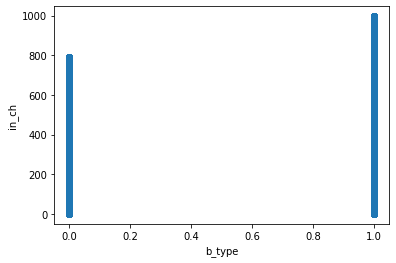

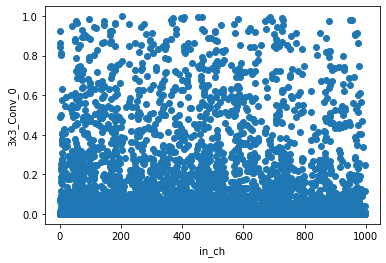

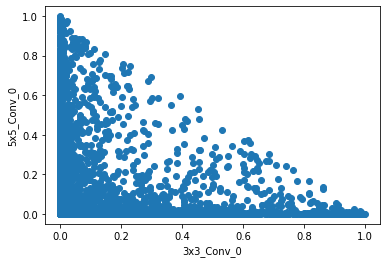

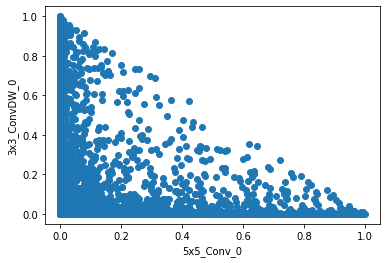

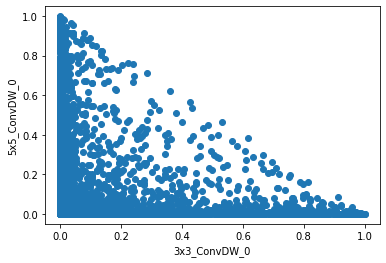

...

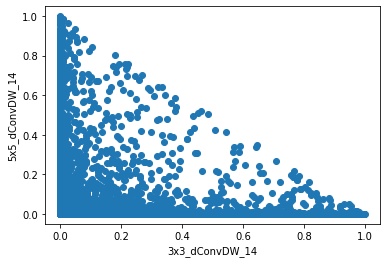

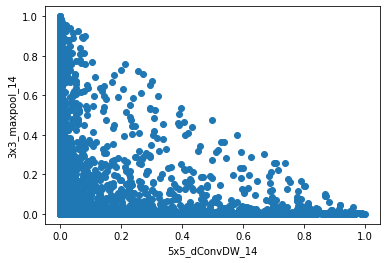

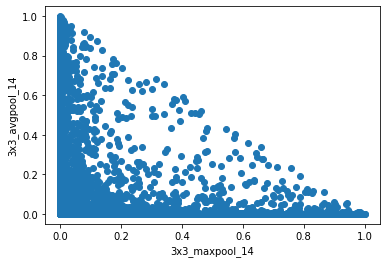

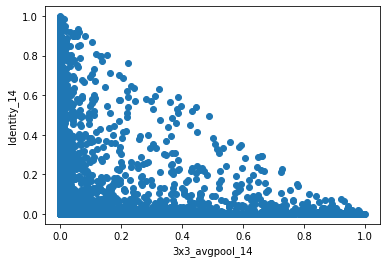

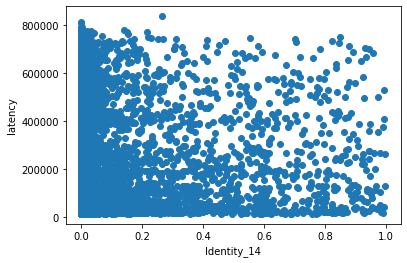

In [129]:
for i in range(len(df.columns)):
  if i <= len(df.columns) - 2:
    plt.scatter(df[df.columns[i]], df[df.columns[i+1]])
    plt.xlabel(df.columns[i])
    plt.ylabel(df.columns[i+1])
    plt.show()